In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import cv2

from tensorflow.python.keras import Model
from keras.preprocessing.image import ImageDataGenerator

from tensorflow.python.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Concatenate, Dropout

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_path = "/content/drive/MyDrive/v3/land-ai.zip"
!cp "{zip_path}" .
!unzip -q land-ai.zip
!rm land-ai.zip

In [ ]:
main_path = "/content/land-ai/images-o"
image_names = []

for i in os.listdir(main_path):
  image_names.append(os.path.join(main_path,i))
  
image_names.sort()

mask_path = "/content/land-ai/masks-o"
mask_names = []

for i in os.listdir(mask_path):
  mask_names.append(os.path.join(mask_path,i))
  
mask_names.sort()

In [ ]:
images=[]

for i in image_names:
  images.append(tf.image.resize(cv2.imread(i,1),(128,128)))

images = np.array(images)

In [ ]:
masks=[]

for i in mask_names:
  masks.append(tf.image.resize(cv2.imread(i,1),(128,128)))

masks = np.array(masks)

In [ ]:
print(f"masks shape: {masks.shape}")
print(f"images shape: {images.shape}")

masks shape: (10674, 128, 128, 3)
images shape: (10674, 128, 128, 3)


In [ ]:
masks = masks[:,:,:,:1]

In [ ]:
x_train = images[:10000]
x_test = images[10000:]
y_train = masks[:10000]
y_test = masks[10000:]

In [ ]:
images = None
masks = None

In [ ]:
y_train_1hot = tf.keras.utils.to_categorical(y_train)
y_test_1hot = tf.keras.utils.to_categorical(y_test)

In [ ]:
y_train = None
image_names = None
mask_names = None

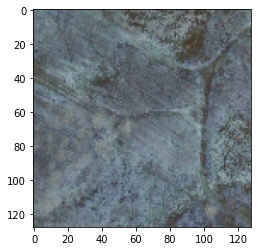

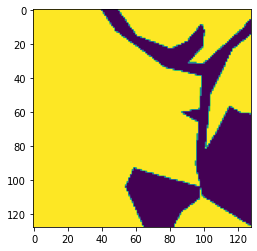

In [ ]:
plt.imshow(x_test[11,:,:,:].astype('uint8'))
plt.show()

plt.imshow(y_test[11,:,:,0].astype('uint8'))
plt.show()

In [ ]:
x_in = Input(shape=(128,128, 3))

x_temp = Conv2D(32, (3, 3), activation='relu', padding='same')(x_in)
x_temp = Dropout(0.25)(x_temp)
x_skip1 = Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
x_temp = MaxPooling2D((2,2))(x_skip1)
x_temp = Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
x_temp = Dropout(0.25)(x_temp)
x_skip2 = Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
x_temp = MaxPooling2D((2,2))(x_skip2)
x_temp = Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
x_temp = Dropout(0.25)(x_temp)
x_skip3 = Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
x_temp = MaxPooling2D((2,2))(x_skip3)
x_temp = Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
x_temp = Dropout(0.5)(x_temp)
x_temp = Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)

x_temp = Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
x_temp = Dropout(0.5)(x_temp)
x_temp = Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
x_temp = Concatenate()([x_temp, x_skip3])
x_temp = Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
x_temp = Dropout(0.5)(x_temp)
x_temp = Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
x_temp = Concatenate()([x_temp, x_skip2])
x_temp = Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
x_temp = Dropout(0.5)(x_temp)
x_temp = Conv2DTranspose(32, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
x_temp = Concatenate()([x_temp, x_skip1])
x_temp = Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
x_temp = Dropout(0.5)(x_temp)
x_temp = Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)

x_temp = Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
x_temp = Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
x_out = Conv2D(5, (1, 1), activation='softmax', padding='same')(x_temp)

model = Model(inputs=x_in, outputs=x_out)

model.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
history = model.fit(x_train, y_train_1hot, validation_data=(x_test, y_test_1hot), epochs=25, batch_size=64, verbose=0)

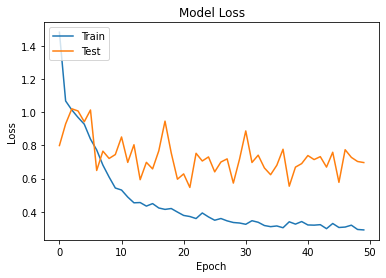

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
preds = model.predict(x_test)

In [ ]:
preds = np.argmax(preds, axis=-1)
print(preds.shape)

(234, 256, 256)


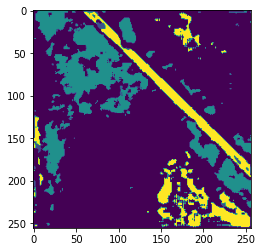

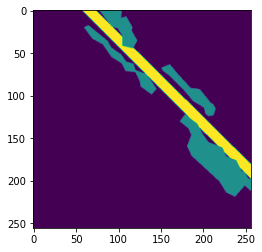

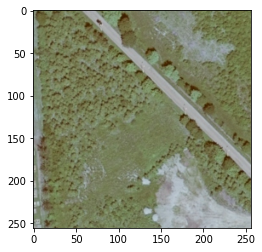

In [ ]:
plt.imshow(preds[23, :, :])
plt.show()
plt.imshow(y_test[23, :, :, 0])
plt.show()
plt.imshow(x_test[23,:,:,:].astype('uint8'))
plt.show()

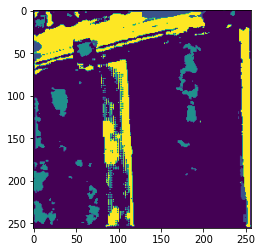

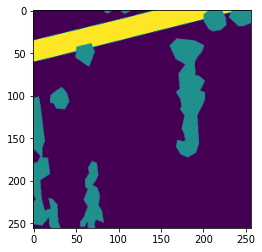

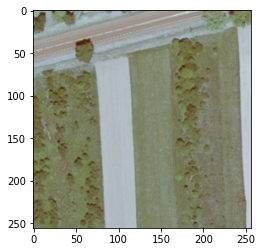

In [ ]:
plt.imshow(preds[1, :, :])
plt.show()
plt.imshow(y_test[1, :, :, 0])
plt.show()
plt.imshow(x_test[1,:,:,:].astype('uint8'))
plt.show()

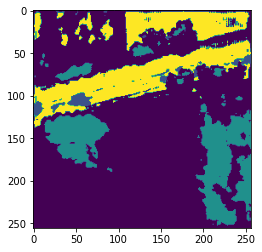

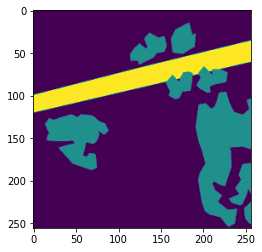

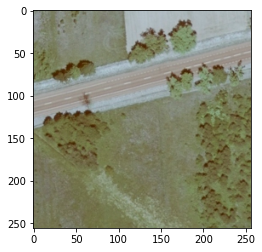

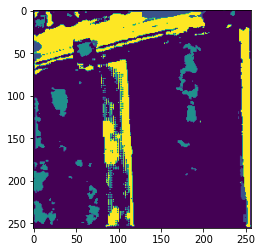

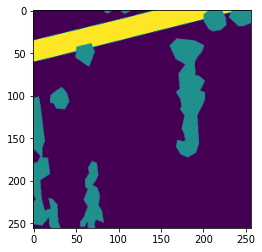

...

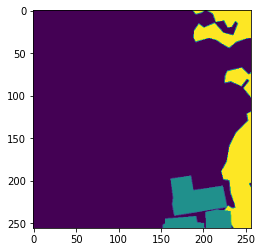

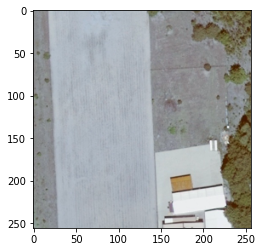

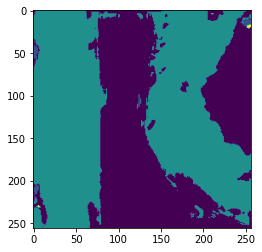

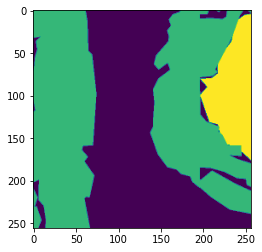

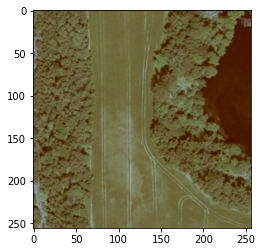

In [ ]:
for i in range(60):
  plt.imshow(preds[i, :, :])
  plt.show()
  plt.imshow(y_test[i, :, :, 0])
  plt.show()
  plt.imshow(x_test[i,:,:,:].astype('uint8'))
  plt.show()

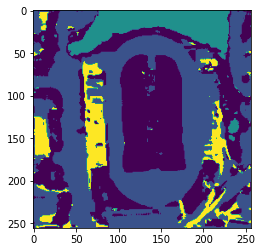

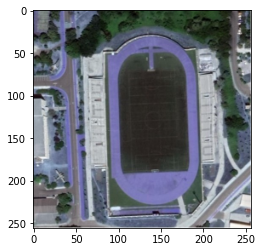

In [ ]:
img = np.array(tf.image.resize(cv2.imread("1.jpg",1),(256,256)))
img = img.reshape(1,*img.shape)
pred = model.predict(img)
pred = np.argmax(pred, axis=-1)

plt.imshow(pred[0, :, :])
plt.show()
plt.imshow(img[0,:,:,:].astype('uint8'))
plt.show()

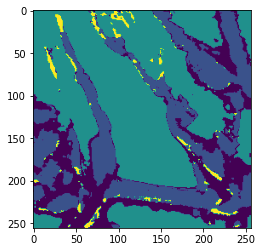

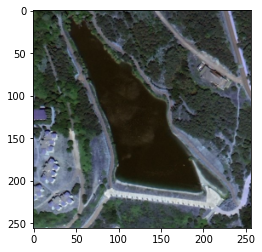

In [ ]:
img = np.array(tf.image.resize(cv2.imread("2.jpg",1),(256,256)))
img = img.reshape(1,*img.shape)
pred = model.predict(img)
pred = np.argmax(pred, axis=-1)

plt.imshow(pred[0, :, :])
plt.show()
plt.imshow(img[0,:,:,:].astype('uint8'))
plt.show()

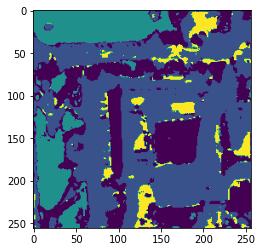

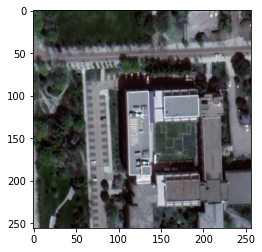

In [ ]:
img = np.array(tf.image.resize(cv2.imread("3.jpg",1),(256,256)))
img = img.reshape(1,*img.shape)
pred = model.predict(img)
pred = np.argmax(pred, axis=-1)

plt.imshow(pred[0, :, :])
plt.show()
plt.imshow(img[0,:,:,:].astype('uint8'))
plt.show()

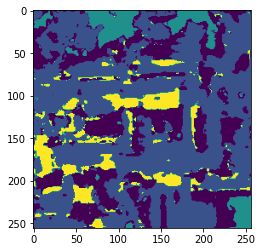

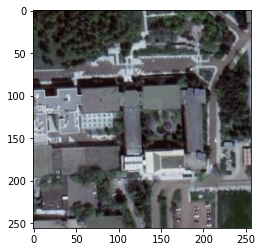

In [ ]:
img = np.array(tf.image.resize(cv2.imread("4.jpg",1),(256,256)))
img = img.reshape(1,*img.shape)
pred = model.predict(img)
pred = np.argmax(pred, axis=-1)

plt.imshow(pred[0, :, :])
plt.show()
plt.imshow(img[0,:,:,:].astype('uint8'))
plt.show()

In [ ]:
model.save("sec-version.h5")